<img src="https://github.com/hernancontigiani/ceia_memorias_especializacion/raw/master/Figures/logoFIUBA.jpg" width="500" align="center">


# Visión por Computadora II
## Trabajo Práctico Integrador

In [ ]:
import kagglehub

path = kagglehub.dataset_download("abdallahalidev/plantvillage-dataset")
print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/plantvillage-dataset


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="dark")

import os
import glob
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.applications import ResNet50, VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.layers import Conv2D,MaxPooling2D,Flatten,Dropout,Dense

np.random.seed(123)
tf.random.set_seed(123)

IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32
EPOCHS = 30

## Análisis Exploratorio

In [ ]:
def explore_dataset(data_dir):
    class_names = sorted(os.listdir(data_dir))
    class_count = len(class_names)

    print(f"Total number of classes: {class_count}")
    print("Classes:")
    for i, class_name in enumerate(class_names):
        jpg_count = len(glob.glob(os.path.join(data_dir, class_name, '*.jpg')))
        JPG_count = len(glob.glob(os.path.join(data_dir, class_name, '*.JPG')))
        total_images = jpg_count + JPG_count
        print(f"{i+1}. {class_name}: {total_images} images")

    return class_names, class_count

In [ ]:
data_dir = '/kaggle/input/plantvillage-dataset/plantvillage dataset/color'
class_names, class_count = explore_dataset(data_dir)

Total number of classes: 38
Classes:
1. Apple___Apple_scab: 630 images
2. Apple___Black_rot: 621 images
3. Apple___Cedar_apple_rust: 275 images
4. Apple___healthy: 1645 images
5. Blueberry___healthy: 1502 images
6. Cherry_(including_sour)___Powdery_mildew: 1052 images
7. Cherry_(including_sour)___healthy: 854 images
8. Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 513 images
9. Corn_(maize)___Common_rust_: 1192 images
10. Corn_(maize)___Northern_Leaf_Blight: 985 images
11. Corn_(maize)___healthy: 1162 images
12. Grape___Black_rot: 1180 images
13. Grape___Esca_(Black_Measles): 1383 images
14. Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1076 images
15. Grape___healthy: 423 images
16. Orange___Haunglongbing_(Citrus_greening): 5507 images
17. Peach___Bacterial_spot: 2297 images
18. Peach___healthy: 360 images
19. Pepper,_bell___Bacterial_spot: 997 images
20. Pepper,_bell___healthy: 1477 images
21. Potato___Early_blight: 1000 images
22. Potato___Late_blight: 1000 images
23. Potato___h

In [ ]:
def get_total_images_per_plant(data_dir):
    class_names = sorted(os.listdir(data_dir))
    records = []

    for class_name in class_names:
        if "___" in class_name:
            plant, disease = class_name.split("___")
        else:
            continue

        image_paths = glob.glob(os.path.join(data_dir, class_name, '*.jpg')) + \
                      glob.glob(os.path.join(data_dir, class_name, '*.JPG'))

        records.append({'Plant': plant, 'Disease': disease, 'Count': len(image_paths)})

    df = pd.DataFrame(records)
    return df

In [ ]:
def plot_total_images_by_plant(df):
    df_grouped = df.groupby('Plant')['Count'].sum().reset_index().sort_values(by='Count', ascending=False)

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(data=df_grouped, x='Plant', y='Count', palette='viridis',
                     hue='Plant', legend=False)

    for container in ax.containers:
        ax.bar_label(container, fontsize=9)

    plt.title("Cantidad total de imágenes por tipo de planta \n sanas y enfermas", fontsize=14)
    plt.xlabel("plant", labelpad=5, fontsize=12)
    plt.ylabel("number of images", labelpad=10, fontsize=12)
    plt.xticks(rotation=45, fontsize=8)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

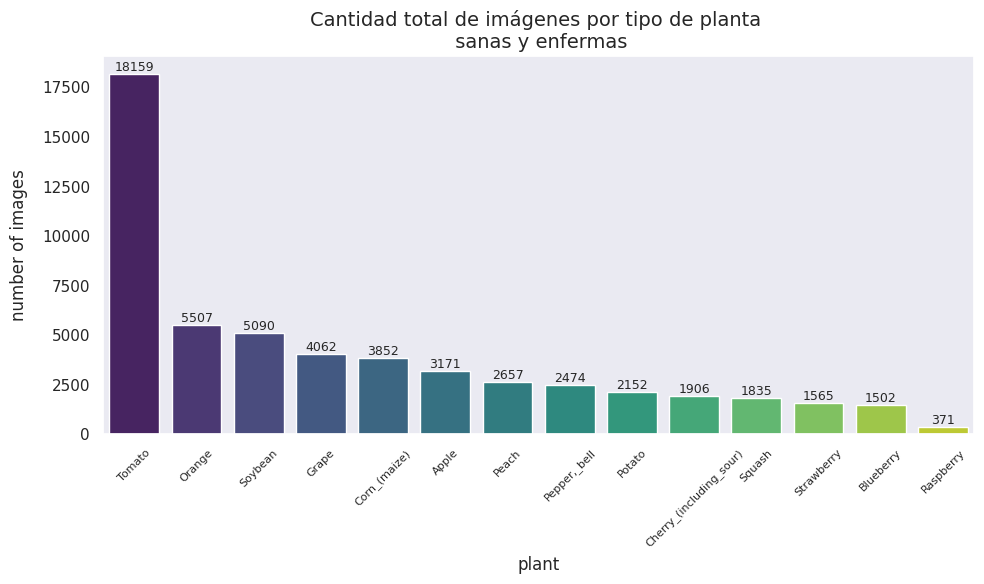

In [ ]:
df_plantas = get_total_images_per_plant(data_dir)
plot_total_images_by_plant(df_plantas)

In [ ]:
def get_dfs(data_dir):
    class_names = sorted(os.listdir(data_dir))
    class_counts = []

    for class_name in class_names:
        image_paths = glob.glob(os.path.join(data_dir, class_name, '*.jpg')) + \
                      glob.glob(os.path.join(data_dir, class_name, '*.JPG'))
        class_counts.append({'Clase': class_name, 'Cantidad': len(image_paths)})

    df = pd.DataFrame(class_counts)
    df = df.sort_values(by='Cantidad', ascending=False) #.head(top_n)

    # df groups
    df['Tipo'] = df['Clase'].apply(lambda x: 'healthy' if 'healthy' in x.lower() else 'no healthy')
    df_grouped = df.groupby('Tipo')['Cantidad'].sum().reset_index()
    df_grouped = df_grouped.sort_values(by='Cantidad', ascending=False)

    return df, df_grouped

def plot_top_classes(df):
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(data=df, y='Clase', x='Cantidad', hue='Clase', dodge=False, palette='viridis', legend=False)

    yticks = ax.get_yticks()
    ax.set_yticks(yticks)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=9)

    for container in ax.containers:
        ax.bar_label(container, fontsize=8)

    plt.title(f"Distribución de imagenes por clases")
    plt.tight_layout()
    plt.show()

def plot_groups(df):
  plt.figure(figsize=(8, 6))

  ax = sns.barplot(data=df, x='Tipo', y='Cantidad', palette='Set2',
                  legend=False, hue='Cantidad')

  for container in ax.containers:
        ax.bar_label(container, fontsize=8)

  plt.title('Saludable vs No Saludable')
  plt.tight_layout()
  plt.show()

In [ ]:
df, df_grouped = get_dfs(data_dir)

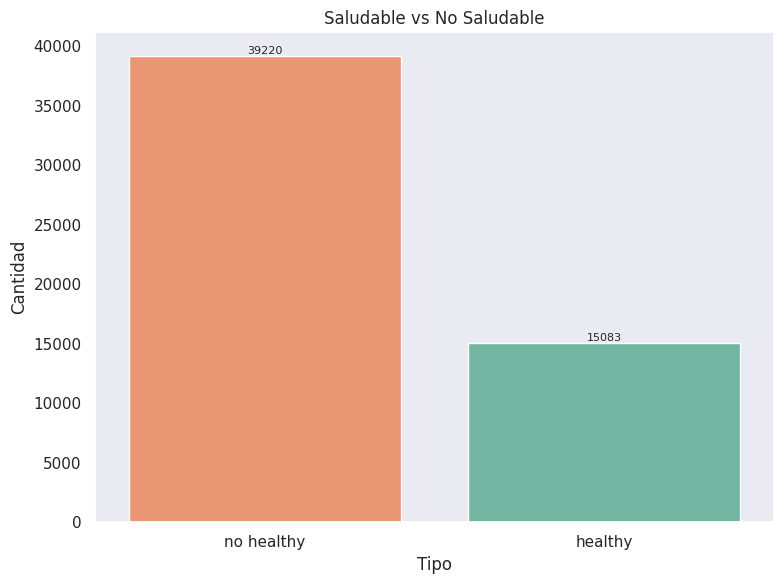

In [ ]:
plot_groups(df_grouped)

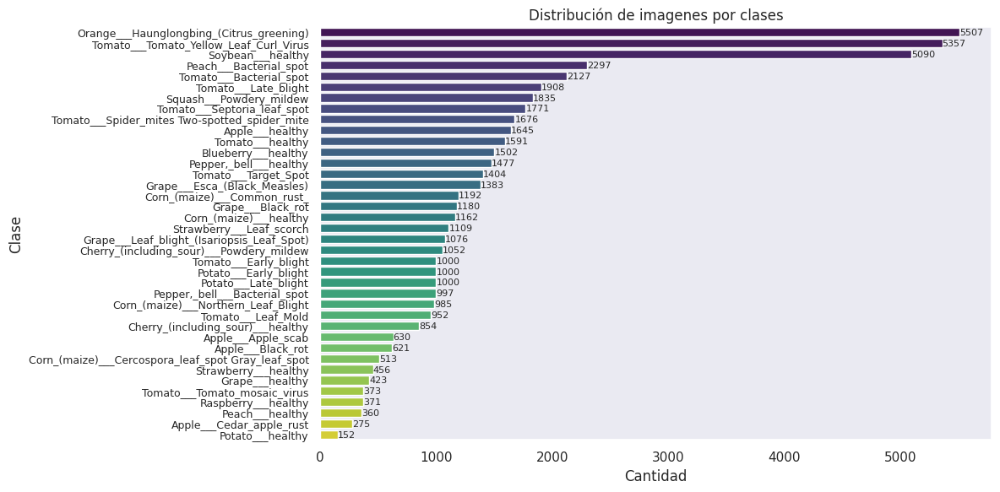

In [ ]:
plot_top_classes(df)

- En el primer gráfico, se puede observar que existe un fuerte desbalance entre las clases saludables y las que representan algún tipo de enfermedad.

- En en segundo gráfico, se puede observar que dentro del top 10 de clases con más imagenes, solo dos corresponden a plantas sanas **Soybean healthy** y **Apple healthy**.

Este desbalance es relevante porque puede sesgar a los modelos de clasificación durante el entrenamiento. En particular, si el modelo se entrena solo con las clases más representadas, tenderá a aprender patrones más precisos para detectar enfermedades, pero podría tener dificultades para identificar correctamente imágenes de plantas sanas, generando falsos positivos.

Tamaño promedio de imágenes

In [ ]:
def compute_image_sizes(data_dir, class_names, max_images=1000):
    widths, heights = [], []

    for class_name in class_names:
        image_paths = glob.glob(os.path.join(data_dir, class_name, '*.jpg')) + \
                      glob.glob(os.path.join(data_dir, class_name, '*.JPG'))
        for path in image_paths[:max_images // len(class_names)]:
            with Image.open(path) as img:
                width, height = img.size
                widths.append(width)
                heights.append(height)

    avg_width = sum(widths) / len(widths)
    avg_height = sum(heights) / len(heights)
    print(f"Tamaño promedio de imagen: {avg_width:.1f} x {avg_height:.1f}")

In [ ]:
compute_image_sizes(data_dir, class_names)

Tamaño promedio de imagen: 256.0 x 256.0


Distribución de infecciones segmentado por tipo de planta

In [ ]:
def get_disease_counts_by_plant(data_dir):
    class_names = sorted(os.listdir(data_dir))
    records = []

    for class_name in class_names:
        if "___" not in class_name:
            continue

        plant, disease = class_name.split("___")
        if "healthy" in disease.lower():
            continue

        image_paths = glob.glob(os.path.join(data_dir, class_name, '*.jpg')) + \
                      glob.glob(os.path.join(data_dir, class_name, '*.JPG'))

        records.append({'Plant': plant, 'Disease': disease, 'Count': len(image_paths)})

    df = pd.DataFrame(records)
    return df


In [ ]:
df_disease = get_disease_counts_by_plant(data_dir)
df_disease

,Plant,Disease,Count
0,Apple,Apple_scab,630
1,Apple,Black_rot,621
2,Apple,Cedar_apple_rust,275
3,Cherry_(including_sour),Powdery_mildew,1052
4,Corn_(maize),Cercospora_leaf_spot Gray_leaf_spot,513
5,Corn_(maize),Common_rust_,1192
6,Corn_(maize),Northern_Leaf_Blight,985
7,Grape,Black_rot,1180
8,Grape,Esca_(Black_Measles),1383
9,Grape,Leaf_blight_(Isariopsis_Leaf_Spot),1076


In [ ]:
def plot_diseases_by_plant_subplots(df):

    plantas = df.groupby("Plant")["Disease"].nunique().sort_values(ascending=False).index
    total = len(plantas)
    cols = 2
    rows = (total + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 4), constrained_layout=True)
    axes = axes.flatten()

    for i in range(len(plantas)):
        planta = plantas[i]
        ax = axes[i]

        sub_df = df[df['Plant'] == planta].sort_values(by="Count", ascending=False)
        sns.barplot(data=sub_df, x="Count", y="Disease", ax=ax, palette="Set2", hue="Disease", legend=False)
        ax.set_title(planta)
        # ax.set_xlabel("Cantidad")
        # ax.set_ylabel("Enfermedad")
        for container in ax.containers:
            ax.bar_label(container, fontsize=6)

    # hide
    for j in range(total, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("Distribución de infecciones por tipo de planta", fontsize=20)
    plt.show()

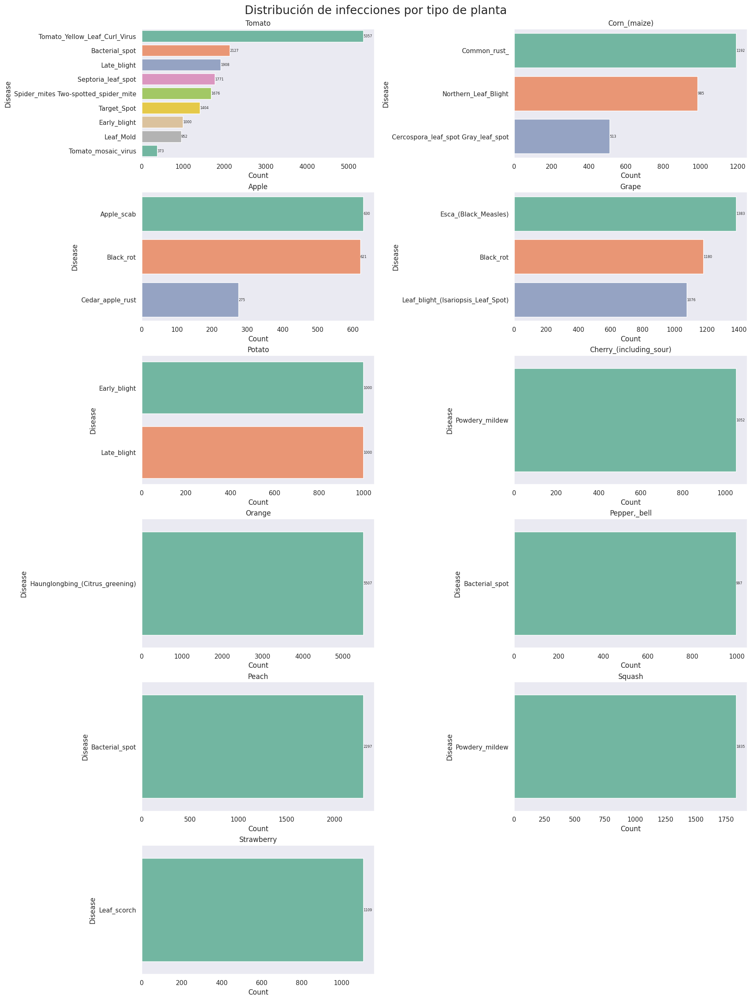

In [ ]:
plot_diseases_by_plant_subplots(df_disease)

In [ ]:
def setup_data_generators(data_dir):
    records = []
    for label in os.listdir(data_dir):
        label_dir = os.path.join(data_dir, label)
        if not os.path.isdir(label_dir): continue
        for fname in os.listdir(label_dir):
            if fname.lower().endswith((".jpg", ".jpeg", ".png")):
                records.append({
                    "filepath": os.path.join(label_dir, fname),
                    "label": label
                })
    df = pd.DataFrame(records)

    # Split train/val from test
    train_val_df, test_df = train_test_split(
        df,
        test_size=0.20,
        stratify=df["label"],
        random_state=42
    )
    # 3) second split: train vs validation (e.g. 80% of train_val → 64% total train, 16% val)
    train_df, valid_df = train_test_split(
        train_val_df,
        test_size=0.20,
        stratify=train_val_df["label"],
        random_state=42
    )

    train_gen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=360,ai s
      horizontal_flip=True,
      vertical_flip=True,
      brightness_range=(0.8, 1.2),
      fill_mode='reflect'
    )
    valid_gen = ImageDataGenerator(rescale=1./255)
    test_gen  = ImageDataGenerator(rescale=1./255)

    # Create training generator with both JPG and jpg extensions
    train_generator = train_gen.flow_from_dataframe(
        train_df, x_col="filepath", y_col="label",
        target_size=(IMG_HEIGHT, IMG_WIDTH),
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        shuffle=True
    )
    validation_generator = valid_gen.flow_from_dataframe(
        valid_df, x_col="filepath", y_col="label",
        target_size=(IMG_HEIGHT, IMG_WIDTH),
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        shuffle=False
    )
    test_generator = test_gen.flow_from_dataframe(
        test_df, x_col="filepath", y_col="label",
        target_size=(IMG_HEIGHT, IMG_WIDTH),
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        shuffle=False
    )
    return train_generator, validation_generator, test_generator

In [ ]:
train_generator, validation_generator, test_generator = setup_data_generators(data_dir)

Found 34755 validated image filenames belonging to 38 classes.
Found 8689 validated image filenames belonging to 38 classes.
Found 10861 validated image filenames belonging to 38 classes.


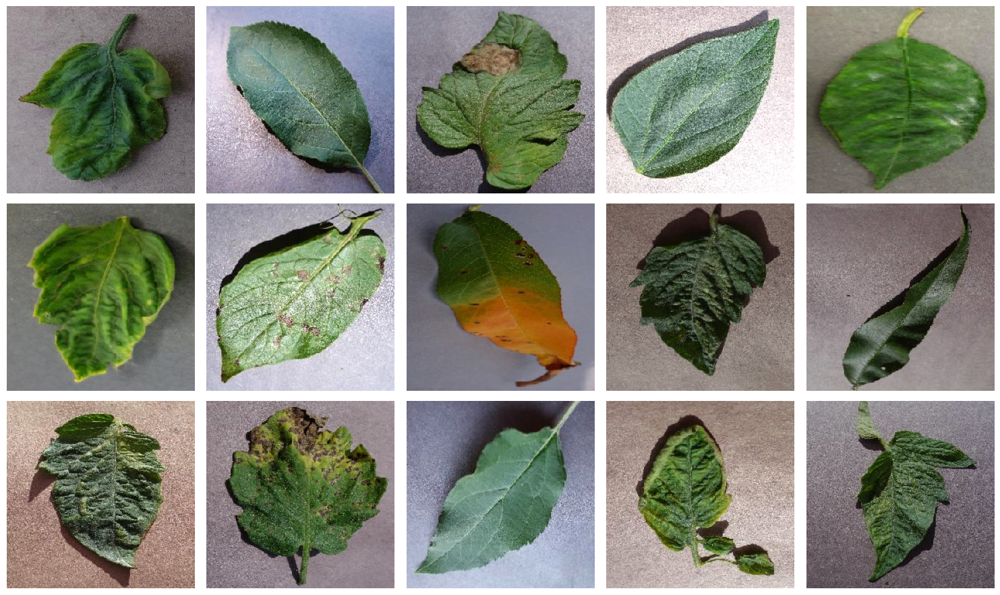

In [ ]:
def random_images(generator, n_imgs=9):
    x_batch, y_batch = next(generator)
    batch_size = x_batch.shape[0]
    n_imgs = min(n_imgs, batch_size)

    idxs = np.random.choice(batch_size, size=n_imgs, replace=False)

    cols = 5
    rows = int(np.ceil(n_imgs/cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols*3, rows*3))
    axes = axes.flatten()

    for ax, idx in zip(axes, idxs):
        img = x_batch[idx]
        ax.imshow(img)
        ax.axis('off')

    for ax in axes[n_imgs:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

random_images(train_generator, n_imgs=15)

### Funciones genericas para construir, entrenar y evaluar modelos

In [ ]:
def build_model(base_model):
    num_classes = len(train_generator.class_indices)

    model = Sequential([
      base_model,
      BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
      Dense(256, activation = 'relu'),
      Dropout(rate= 0.45, seed= 123),
      Dense(num_classes, activation = 'softmax')
    ])

    model.compile(Adam(learning_rate= 0.0001), loss= 'categorical_crossentropy', metrics= ['accuracy'])
    model.summary()

    return model

In [ ]:
def train_model(model, train_generator, validation_generator, checkpoint):
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6),
        ModelCheckpoint(checkpoint, monitor='val_accuracy', save_best_only=True)
    ]

    history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // BATCH_SIZE,
        epochs=12,
        validation_data=validation_generator,
        validation_steps=validation_generator.samples // BATCH_SIZE,
        callbacks=callbacks
    )

    return history

In [ ]:
def plot_training_history(history):
    # Plot training & validation accuracy
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='lower right')

    # Plot training & validation loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper right')
    plt.tight_layout()
    plt.savefig('training_history.png')
    plt.show()

In [ ]:
def evaluate_model(model, test_generator, class_names):
    test_loss, test_accuracy = model.evaluate(test_generator)
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print(f"Test Loss: {test_loss:.4f}")

    # Generate predictions for classification report
    test_generator.reset()
    y_pred = []
    y_true = []
    batch_index = 0
    total_batches = int(np.ceil(test_generator.samples / BATCH_SIZE))

    for i in range(total_batches):
        x_batch, y_batch = next(test_generator)

        pred_batch = model.predict(x_batch,verbose=0 )

        y_pred.extend(np.argmax(pred_batch, axis=1))
        y_true.extend(np.argmax(y_batch, axis=1))
        batch_index += 1

        if batch_index >= test_generator.samples / BATCH_SIZE:
            break

    f1 = f1_score(y_true, y_pred, average='weighted')
    print('f1-score: ', f1)

    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Plot confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(16, 12))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=90)
    plt.yticks(tick_marks, class_names)
    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.savefig('confusion_matrix.png')
    plt.show()

    return y_true, y_pred

In [ ]:
def visualize_predictions(model, test_generator, class_names):
    test_generator.reset()
    batch_images, batch_labels = next(test_generator)
    predictions = model.predict(batch_images)

    plt.figure(figsize=(15, 15))
    for i in range(min(9, len(batch_images))):
        plt.subplot(3, 3, i+1)
        plt.imshow(batch_images[i])

        true_class = np.argmax(batch_labels[i])
        pred_class = np.argmax(predictions[i])
        confidence = predictions[i][pred_class]

        title_color = 'green' if true_class == pred_class else 'red'
        plt.title(f"True: {class_names[true_class]}\nPred: {class_names[pred_class]} ({confidence:.2f})",
                 color=title_color)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('prediction_examples.png')
    plt.show()

In [ ]:
!pip install keras-tuner --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 11.5 MB/s eta 0:00:00


In [ ]:
import keras_tuner as kt

def build_hp_model(hp, base_model):
    model = Sequential()
    model.add(base_model)
    model.add(BatchNormalization(momentum=hp.Float('bn_momentum', 0.85, 0.99, step=0.01)))
    model.add(Dense(
        units=hp.Int('dense_units', min_value=128, max_value=512, step=64),
        activation='relu'
    ))
    model.add(Dropout(rate=hp.Float('dropout_rate', 0.3, 0.6, step=0.05)))
    num_classes = len(train_generator.class_indices)
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', [1e-3, 1e-4, 5e-5])),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

## ResNet50

In [ ]:
img_shape = (IMG_HEIGHT, IMG_WIDTH, 3)
base_model = ResNet50(
    weights='imagenet',
    include_top=False, # Ignore fully-connected latest layers
    input_shape=img_shape,
    pooling='avg' # Adds a global average pooling layer
)
model = build_model(base_model)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 38)             │         9,766 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,130,214 (92.05 MB)

 Trainable params: 24,072,998 (91.83 MB)

 Non-trainable params: 57,216 (223.50 KB)

In [ ]:
history = train_model(model, train_generator, validation_generator, 'best_resnet50_model.keras')

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 428s 339ms/step - accuracy: 0.7732 - loss: 0.8975 - val_accuracy: 0.4732 - val_loss: 2.7760 - learning_rate: 1.0000e-04
Epoch 2/12
   1/1086 ━━━━━━━━━━━━━━━━━━━━ 2:35 143ms/step - accuracy: 0.8750 - loss: 0.5254

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


1086/1086 ━━━━━━━━━━━━━━━━━━━━ 17s 16ms/step - accuracy: 0.8750 - loss: 0.5254 - val_accuracy: 0.4768 - val_loss: 2.7036 - learning_rate: 1.0000e-04
Epoch 3/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 170s 156ms/step - accuracy: 0.9605 - loss: 0.1304 - val_accuracy: 0.9624 - val_loss: 0.1230 - learning_rate: 1.0000e-04
Epoch 4/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 21s 19ms/step - accuracy: 0.9688 - loss: 0.0488 - val_accuracy: 0.9628 - val_loss: 0.1223 - learning_rate: 1.0000e-04
Epoch 5/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 169s 156ms/step - accuracy: 0.9741 - loss: 0.0862 - val_accuracy: 0.9848 - val_loss: 0.0455 - learning_rate: 1.0000e-04
Epoch 6/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 17s 16ms/step - accuracy: 1.0000 - loss: 0.0028 - val_accuracy: 0.9851 - val_loss: 0.0445 - learning_rate: 1.0000e-04
Epoch 7/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 168s 155ms/step - accuracy: 0.9777 - loss: 0.0699 - val_accuracy: 0.9792 - val_loss: 0.0628 - learning_rate: 1.0000e-04
Epoch 8/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 15s

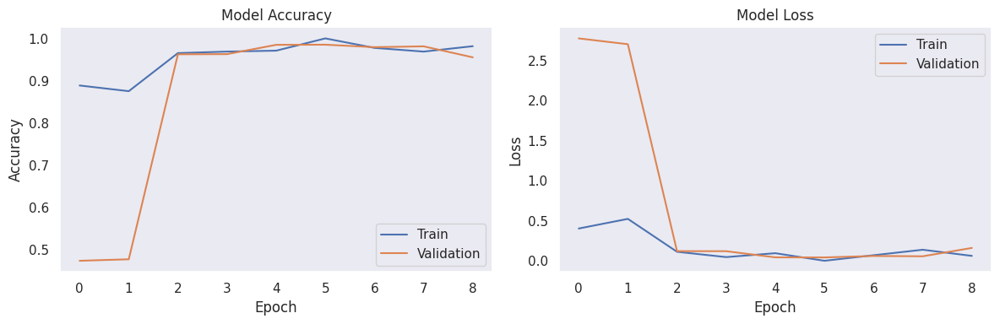

In [ ]:
plot_training_history(history)

340/340 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - accuracy: 0.9843 - loss: 0.0432
Test Accuracy: 0.9844
Test Loss: 0.0476
f1-score:  0.984311813626205
Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.98      0.98       126
                                 Apple___Black_rot       1.00      0.98      0.99       124
                          Apple___Cedar_apple_rust       0.95      1.00      0.97        55
                                   Apple___healthy       0.99      1.00      0.99       329
                               Blueberry___healthy       1.00      1.00      1.00       300
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      1.00       210
                 Cherry_(including_sour)___healthy       1.00      0.99      1.00       171
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.74      0.84       103
  

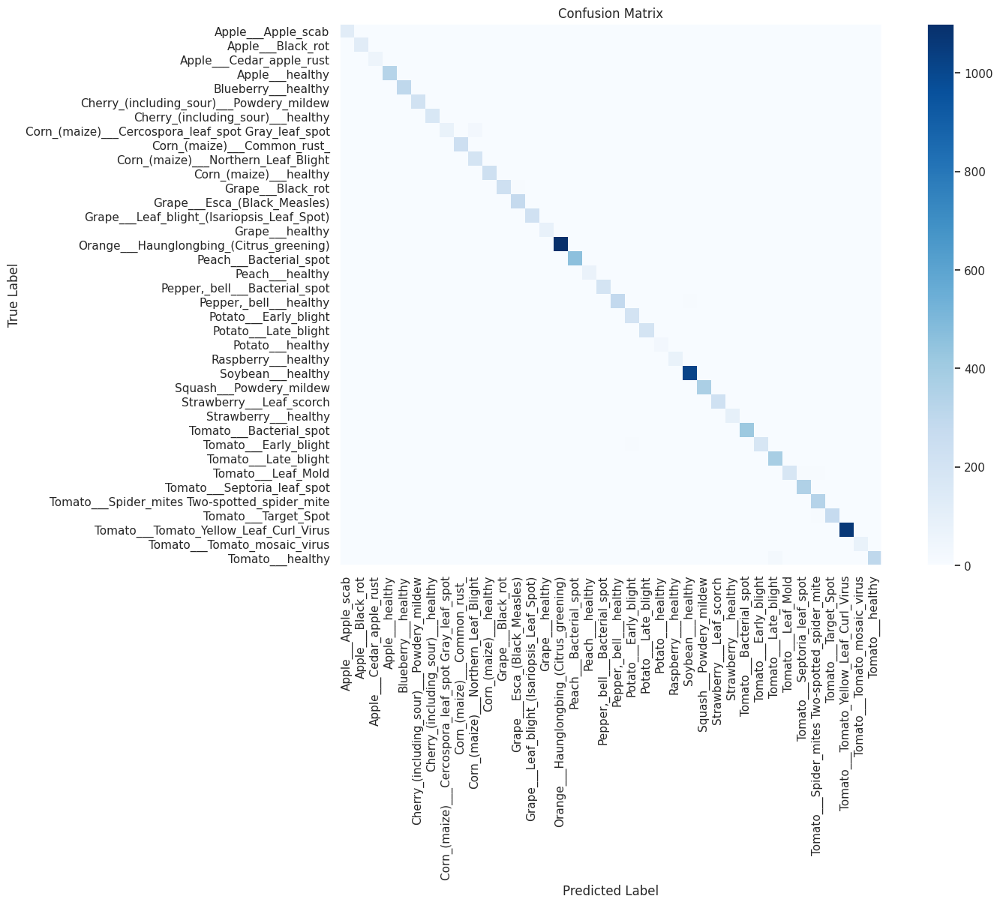

In [ ]:
y_true, y_pred = evaluate_model(model, test_generator, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


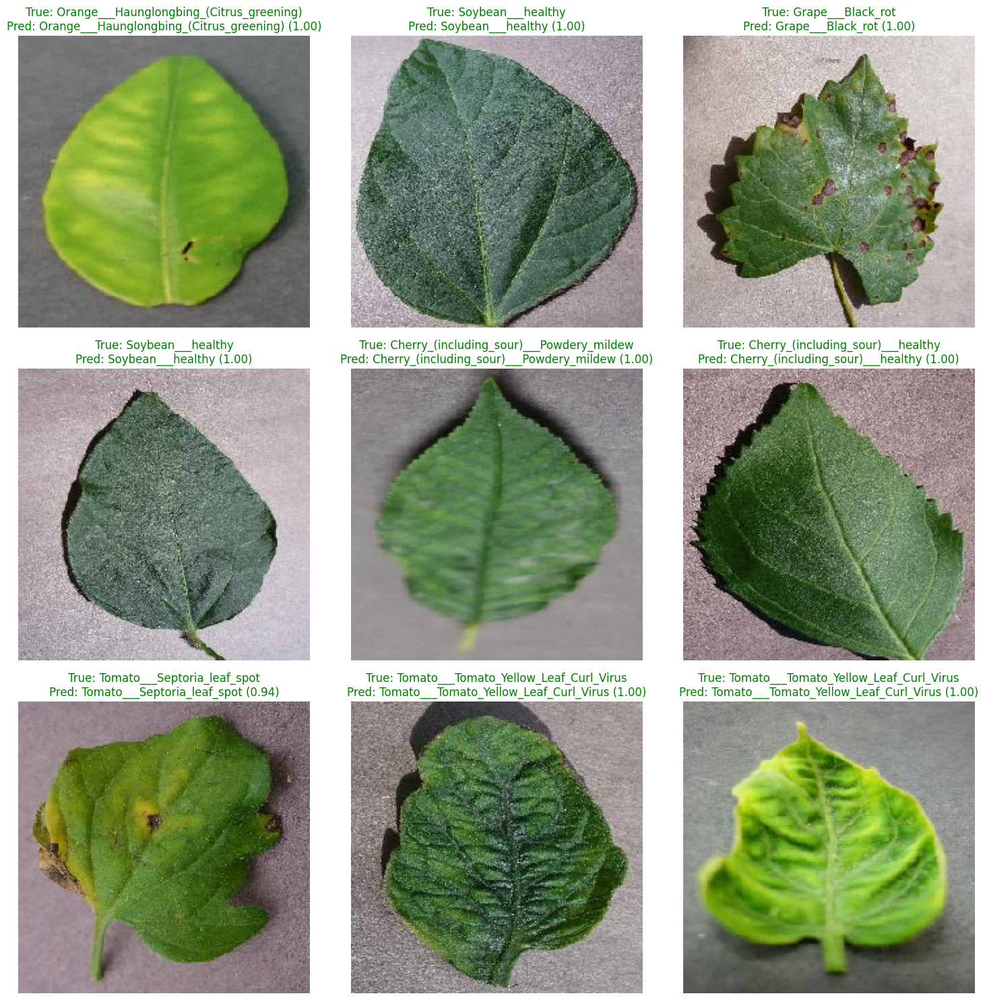

In [ ]:
visualize_predictions(model, test_generator, class_names)

In [ ]:
def build_with_base(hp):
    return build_hp_model(hp, base_model)

tuner = kt.Hyperband(
    build_with_base,
    objective='val_accuracy',
    max_epochs=8,
    factor=3,
    directory='/content/drive/MyDrive/Especializacion_IA/ktuner_dir',
    project_name='resnet50_tuning'
)

stop_early = EarlyStopping(monitor='val_loss', patience=1)

tuner.search(
    train_generator,
    epochs=5,
    validation_data=validation_generator,
    callbacks=[stop_early],
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    validation_steps=validation_generator.samples // BATCH_SIZE,
)

Reloading Tuner from /content/drive/MyDrive/Especializacion_IA/ktuner_dir/resnet50_tuning/tuner0.json


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


340/340 ━━━━━━━━━━━━━━━━━━━━ 88s 233ms/step - accuracy: 0.9852 - loss: 0.0460
Test Accuracy: 0.9845
Test Loss: 0.0504
f1-score:  0.9845703381293867
Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.94      0.97       126
                                 Apple___Black_rot       0.97      1.00      0.98       124
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        55
                                   Apple___healthy       0.99      0.99      0.99       329
                               Blueberry___healthy       1.00      1.00      1.00       300
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      0.99       210
                 Cherry_(including_sour)___healthy       1.00      0.98      0.99       171
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.93      0.89      0.91       103


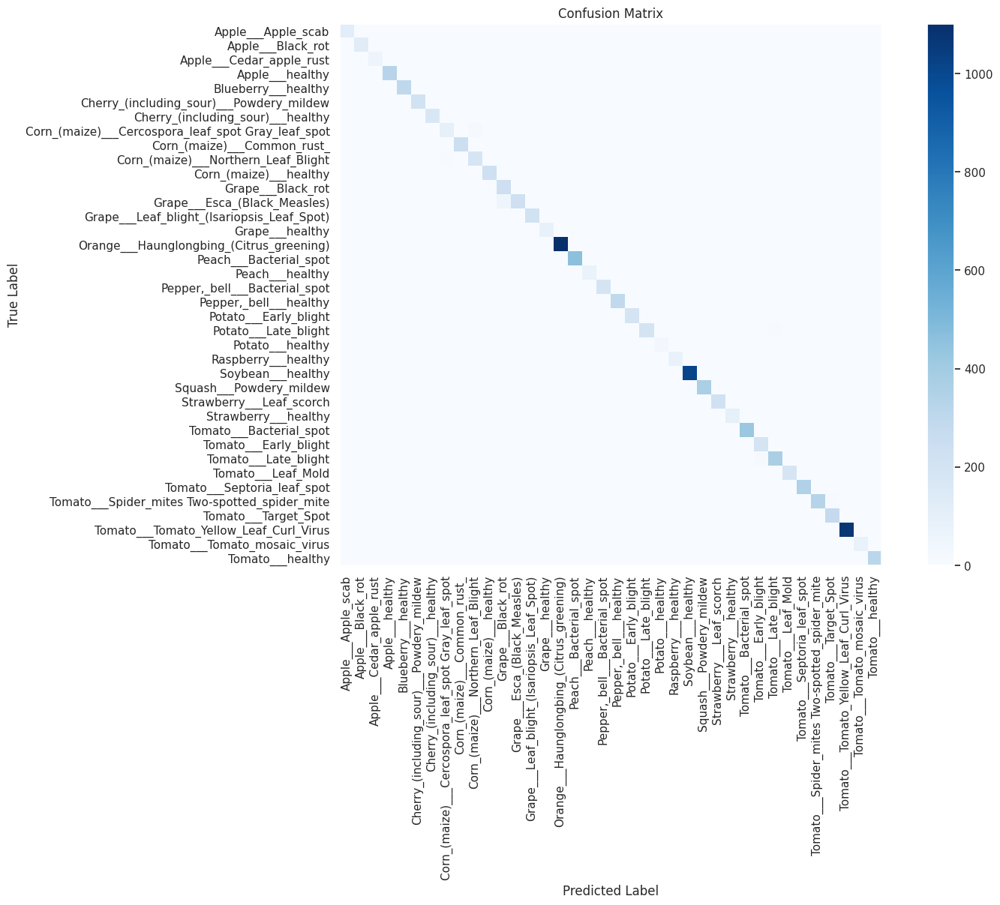

In [ ]:
best_resnet50_model = tuner.get_best_models(num_models=1)[0]
y_true, y_pred = evaluate_model(best_resnet50_model, test_generator, class_names)

## VGG16

In [ ]:
base_vgg16_model = VGG16(
    weights='imagenet',
    name="vgg16",
    include_top=False, #  sin las capas densas
    input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
    pooling='avg'
)

vgg16_model = build_model(base_vgg16_model)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 512)            │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 38)             │         9,766 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,857,830 (56.68 MB)

 Trainable params: 14,856,806 (56.67 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [ ]:
history = train_model(vgg16_model, train_generator, validation_generator, 'best_vgg16_model.keras')

Epoch 1/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 335s 280ms/step - accuracy: 0.5689 - loss: 1.7321 - val_accuracy: 0.8623 - val_loss: 0.4527 - learning_rate: 1.0000e-04
Epoch 2/12
   1/1086 ━━━━━━━━━━━━━━━━━━━━ 4:15 236ms/step - accuracy: 0.9062 - loss: 0.3304

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


1086/1086 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - accuracy: 0.9062 - loss: 0.3304 - val_accuracy: 0.8658 - val_loss: 0.4413 - learning_rate: 1.0000e-04
Epoch 3/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 288s 265ms/step - accuracy: 0.9343 - loss: 0.2255 - val_accuracy: 0.9298 - val_loss: 0.2122 - learning_rate: 1.0000e-04
Epoch 4/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - accuracy: 0.9375 - loss: 0.1708 - val_accuracy: 0.9306 - val_loss: 0.2090 - learning_rate: 1.0000e-04
Epoch 5/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 287s 265ms/step - accuracy: 0.9595 - loss: 0.1333 - val_accuracy: 0.9566 - val_loss: 0.1298 - learning_rate: 1.0000e-04
Epoch 6/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 21s 19ms/step - accuracy: 0.9375 - loss: 0.0982 - val_accuracy: 0.9464 - val_loss: 0.1587 - learning_rate: 1.0000e-04
Epoch 7/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 287s 264ms/step - accuracy: 0.9681 - loss: 0.1002 - val_accuracy: 0.9734 - val_loss: 0.0768 - learning_rate: 1.0000e-04
Epoch 8/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 21s

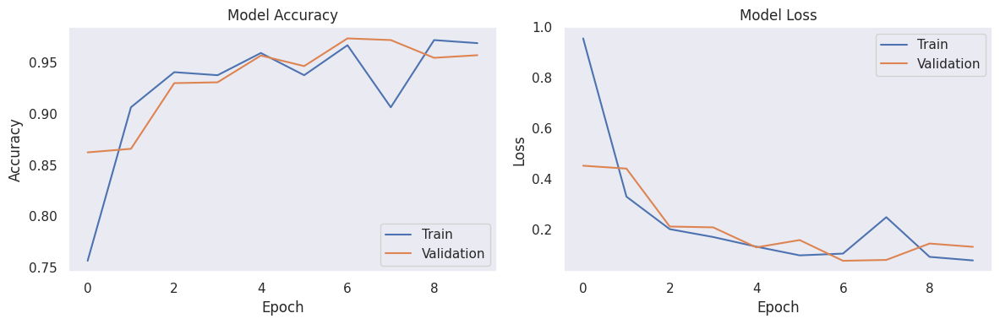

In [ ]:
plot_training_history(history)

340/340 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - accuracy: 0.9711 - loss: 0.0858
Test Accuracy: 0.9737
Test Loss: 0.0827
f1-score:  0.9733887331303022
Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.91      0.95       126
                                 Apple___Black_rot       1.00      0.98      0.99       124
                          Apple___Cedar_apple_rust       1.00      0.98      0.99        55
                                   Apple___healthy       0.99      1.00      0.99       329
                               Blueberry___healthy       0.99      1.00      1.00       300
          Cherry_(including_sour)___Powdery_mildew       1.00      0.99      1.00       210
                 Cherry_(including_sour)___healthy       0.99      0.98      0.99       171
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.96      0.90      0.93       103
 

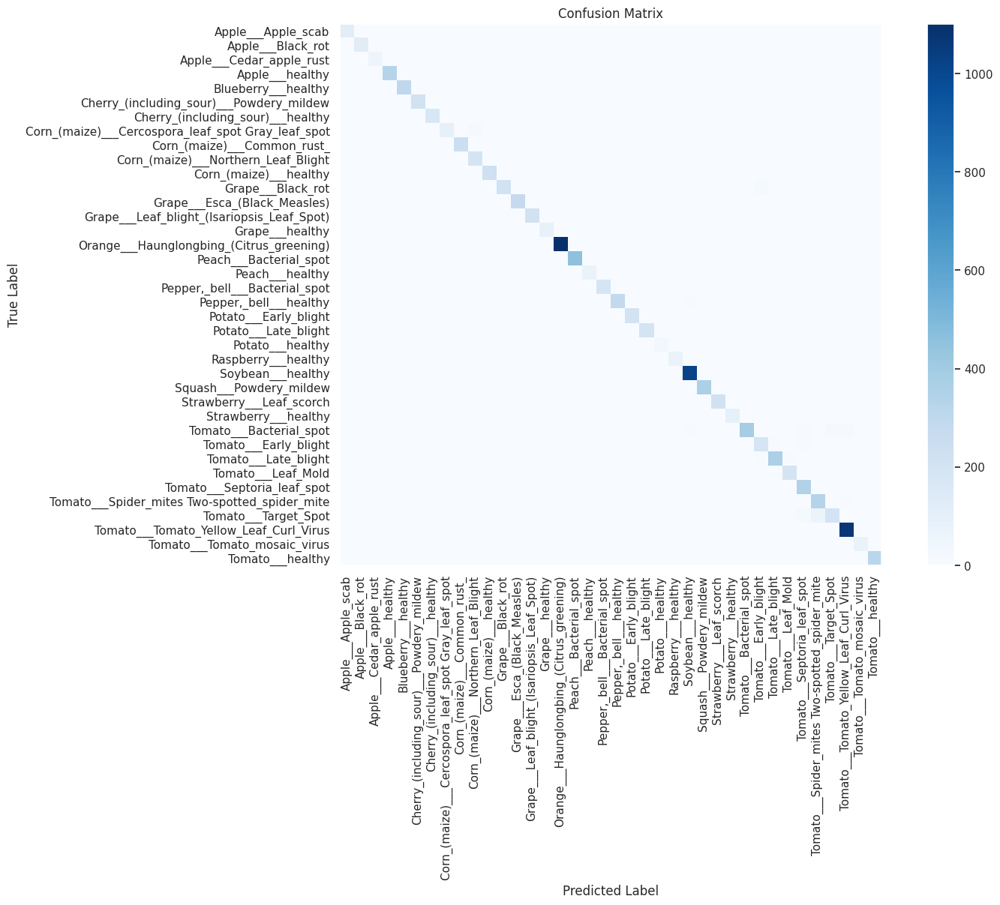

In [ ]:
y_true, y_pred = evaluate_model(vgg16_model, test_generator, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


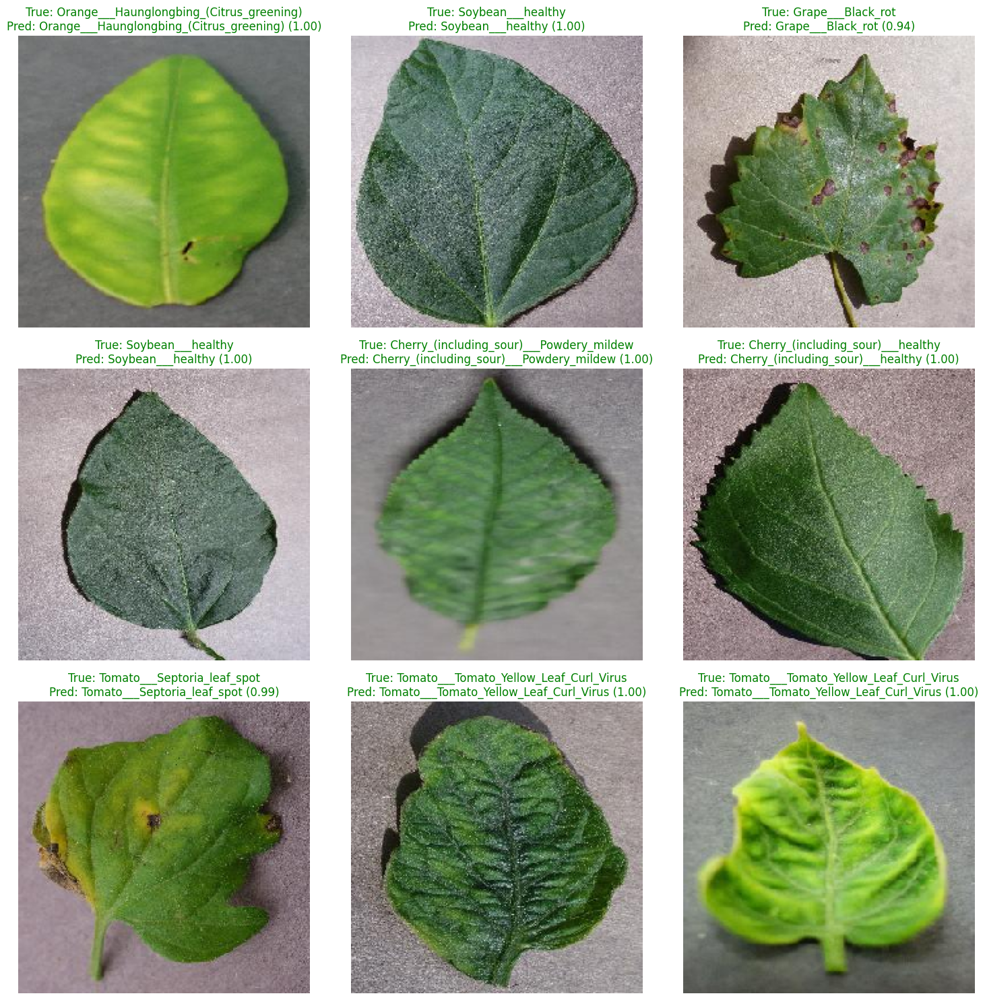

In [ ]:
visualize_predictions(vgg16_model, test_generator, class_names)

In [ ]:
def build_with_base(hp):
    return build_hp_model(hp, base_vgg16_model)

tuner = kt.Hyperband(
    build_with_base,
    objective='val_accuracy',
    max_epochs=8,
    factor=3,
    directory='/content/drive/MyDrive/Especializacion_IA/ktuner_dir',
    project_name='vgg16_tuning'
)

stop_early = EarlyStopping(monitor='val_loss', patience=1)

tuner.search(
    train_generator,
    epochs=5,
    validation_data=validation_generator,
    callbacks=[stop_early],
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    validation_steps=validation_generator.samples // BATCH_SIZE,
)

Reloading Tuner from /content/drive/MyDrive/Especializacion_IA/ktuner_dir/vgg16_tuning/tuner0.json


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 66 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


340/340 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - accuracy: 0.9965 - loss: 0.0129
Test Accuracy: 0.9963
Test Loss: 0.0144
f1-score:  0.9963220566136118
Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.98      0.99       126
                                 Apple___Black_rot       1.00      1.00      1.00       124
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        55
                                   Apple___healthy       1.00      1.00      1.00       329
                               Blueberry___healthy       1.00      1.00      1.00       300
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      1.00       210
                 Cherry_(including_sour)___healthy       0.99      0.99      0.99       171
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.94      0.98      0.96       103
 

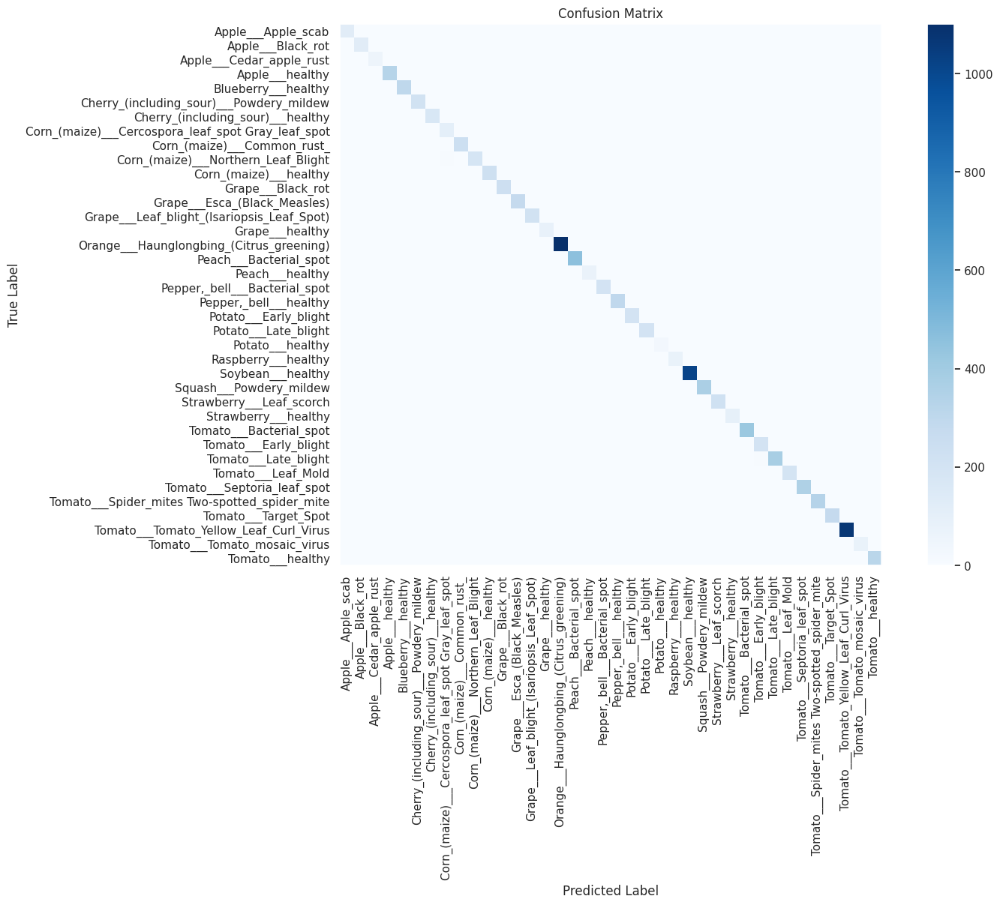

In [ ]:
best_vgg16_model = tuner.get_best_models(num_models=1)[0]
y_true, y_pred = evaluate_model(best_vgg16_model, test_generator, class_names)

## EfficientNetB5

In [ ]:
from tensorflow.keras.applications import EfficientNetB5

base_efnetB5_model = EfficientNetB5(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
    pooling='max'
)

efnetB5_model = build_model(base_efnetB5_model)

115263384/115263384 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb5 (Functional)     │ (None, 2048)           │    28,513,527 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 38)             │         9,766 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,056,029 (110.84 MB)

 Trainable params: 28,879,190 (110.17 MB)

 Non-trainable params: 176,839 (690.78 KB)

In [ ]:
history = train_model(efnetB5_model, train_generator, validation_generator, 'best_efnetB5_model.keras')

Epoch 1/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 553s 351ms/step - accuracy: 0.6009 - loss: 1.6083 - val_accuracy: 0.8331 - val_loss: 0.6272 - learning_rate: 1.0000e-04
Epoch 2/12
   1/1086 ━━━━━━━━━━━━━━━━━━━━ 4:52 270ms/step - accuracy: 0.9062 - loss: 0.3268

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


1086/1086 ━━━━━━━━━━━━━━━━━━━━ 19s 17ms/step - accuracy: 0.9062 - loss: 0.3268 - val_accuracy: 0.8263 - val_loss: 0.6595 - learning_rate: 1.0000e-04
Epoch 3/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 299s 275ms/step - accuracy: 0.9519 - loss: 0.1539 - val_accuracy: 0.9427 - val_loss: 0.1834 - learning_rate: 1.0000e-04
Epoch 4/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - accuracy: 0.9375 - loss: 0.1602 - val_accuracy: 0.9491 - val_loss: 0.1669 - learning_rate: 1.0000e-04
Epoch 5/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 296s 273ms/step - accuracy: 0.9763 - loss: 0.0785 - val_accuracy: 0.9143 - val_loss: 0.2987 - learning_rate: 1.0000e-04
Epoch 6/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 19s 17ms/step - accuracy: 0.9375 - loss: 0.1520 - val_accuracy: 0.9136 - val_loss: 0.2989 - learning_rate: 1.0000e-04
Epoch 7/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 298s 274ms/step - accuracy: 0.9792 - loss: 0.0673 - val_accuracy: 0.9681 - val_loss: 0.1154 - learning_rate: 1.0000e-04
Epoch 8/12
1086/1086 ━━━━━━━━━━━━━━━━━━━━ 22s

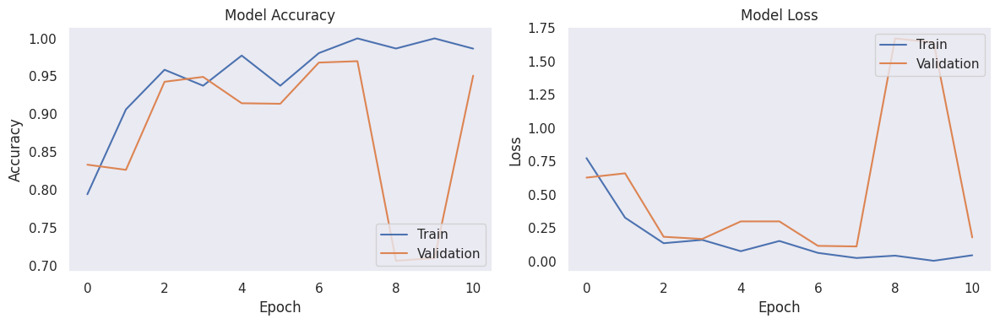

In [ ]:
plot_training_history(history)

340/340 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - accuracy: 0.9668 - loss: 0.1131
Test Accuracy: 0.9661
Test Loss: 0.1165
f1-score:  0.9651784053937789
Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.79      0.88       126
                                 Apple___Black_rot       0.99      0.99      0.99       124
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        55
                                   Apple___healthy       0.94      1.00      0.97       329
                               Blueberry___healthy       1.00      0.98      0.99       300
          Cherry_(including_sour)___Powdery_mildew       0.96      1.00      0.98       210
                 Cherry_(including_sour)___healthy       1.00      0.99      1.00       171
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.87      0.92      0.90       103
 

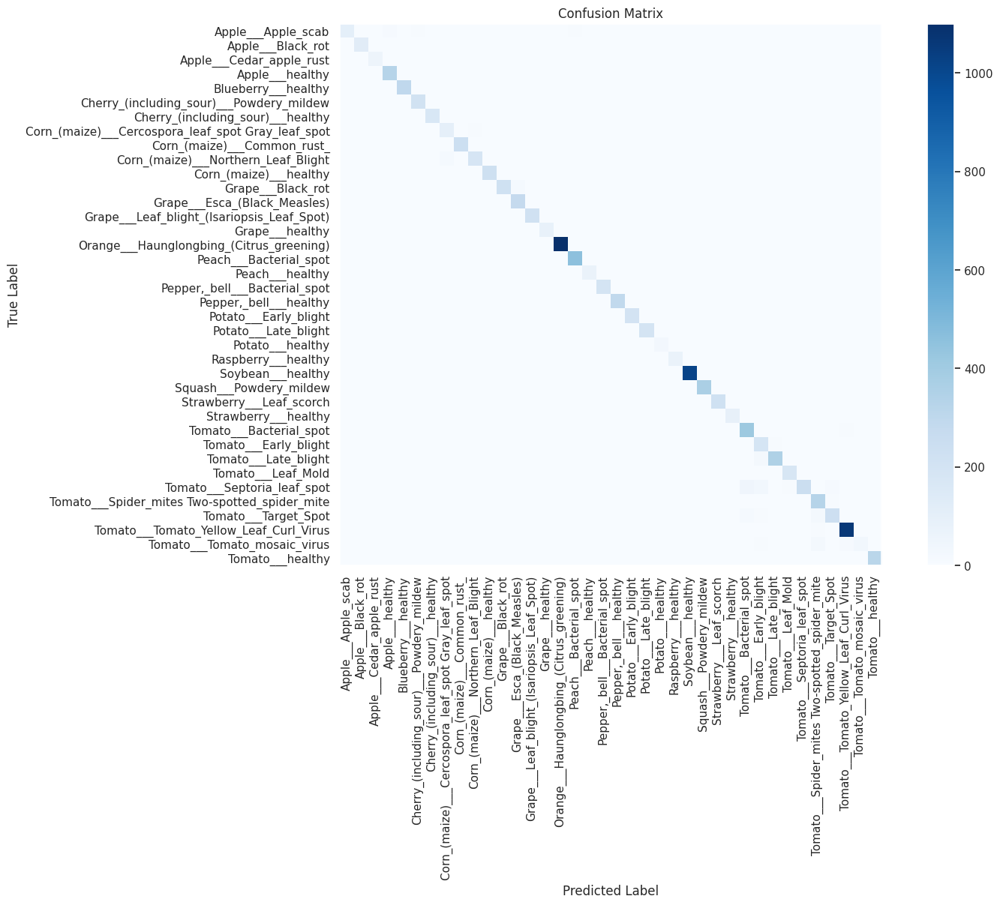

In [ ]:
y_true, y_pred = evaluate_model(efnetB5_model, test_generator, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


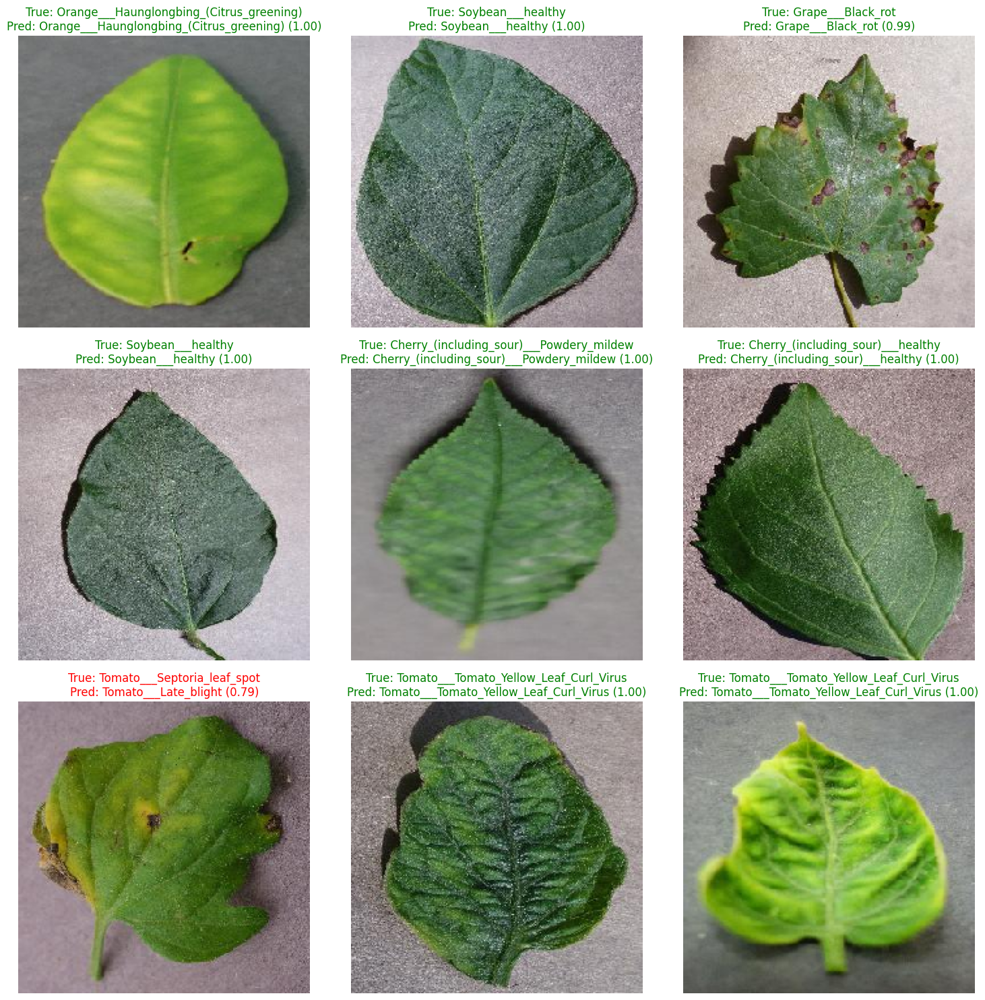

In [ ]:
visualize_predictions(efnetB5_model, test_generator, class_names)

In [ ]:
def build_with_base(hp):
    return build_hp_model(hp, base_efnetB5_model)

tuner = kt.Hyperband(
    build_with_base,
    objective='val_accuracy',
    max_epochs=8,
    factor=3,
    directory='/content/drive/MyDrive/Especializacion_IA/ktuner_dir',
    project_name='efnetB5_tuning'
)

stop_early = EarlyStopping(monitor='val_loss', patience=1)

tuner.search(
    train_generator,
    epochs=5,
    validation_data=validation_generator,
    callbacks=[stop_early],
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    validation_steps=validation_generator.samples // BATCH_SIZE,
)

Reloading Tuner from /content/drive/MyDrive/Especializacion_IA/ktuner_dir/efnetB5_tuning/tuner0.json


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 1022 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


340/340 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - accuracy: 0.9746 - loss: 0.0882
Test Accuracy: 0.9731
Test Loss: 0.0936
f1-score:  0.9731950891699628
Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.99      0.96      0.98       126
                                 Apple___Black_rot       0.95      1.00      0.98       124
                          Apple___Cedar_apple_rust       1.00      0.98      0.99        55
                                   Apple___healthy       0.99      1.00      0.99       329
                               Blueberry___healthy       1.00      1.00      1.00       300
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      1.00       210
                 Cherry_(including_sour)___healthy       1.00      0.99      1.00       171
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.91      0.87      0.89       103
 

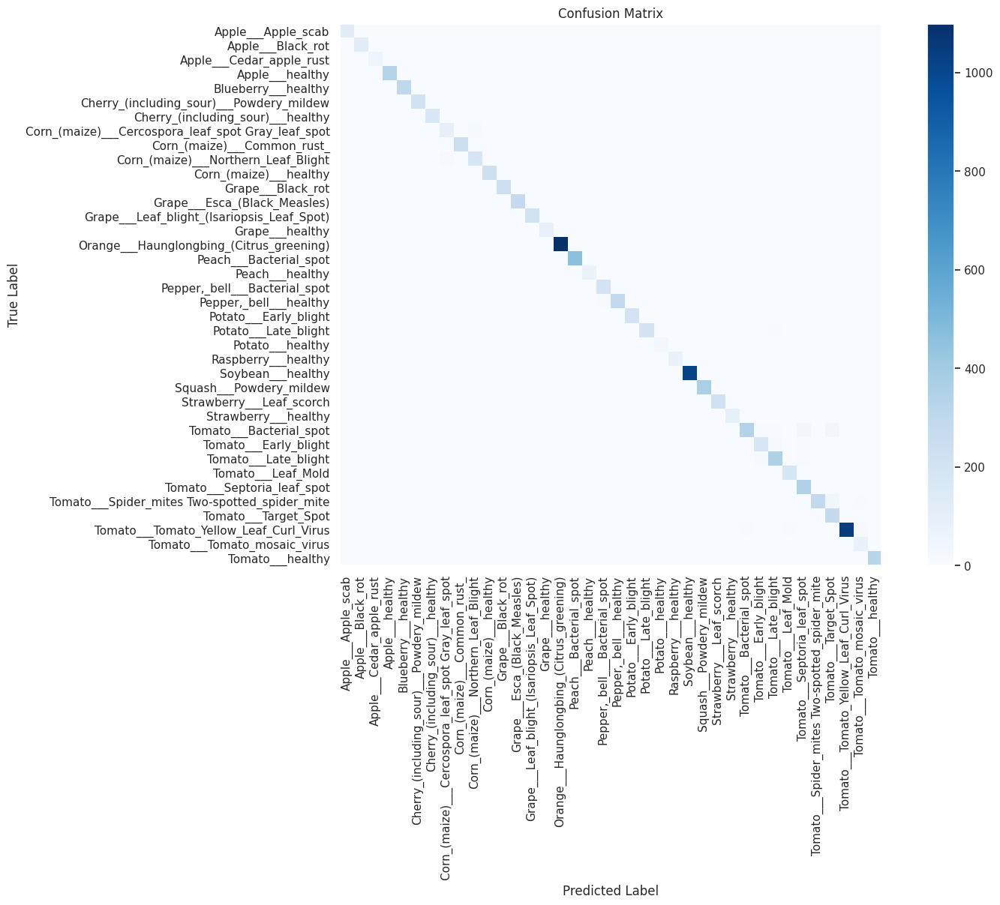

In [ ]:
best_efnetB5_model = tuner.get_best_models(num_models=1)[0]
y_true, y_pred = evaluate_model(best_efnetB5_model, test_generator, class_names)